In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
!pip install git+https://github.com/tensorflow/docs

Defaulting to user installation because normal site-packages is not writeable
  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-u41dl01v
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0223c742794ed4f1d4504017f706e4ab110cfd626_-py3-none-any.whl size=140658 sha256=bb29fbb3bbf28a30891bdb8454643473b026c2efff2cbd15024cae6923026c81
  Stored in directory: /tmp/pip-ephem-wheel-cache-q27t_syy/wheels/27/ca/30/9fb73780f8e8eb5a8321ae35616b0e9609f33e6c6f4071e8dd
Successfully built tensorflow-docs
  Attempting uninstall: tensorflow-docs
    Found existing installation: tensorflow-docs 0.0.0b66fbea491e6bdb019195f8a82b193fc543a6457-
    Uninstalling tensorflow-docs-0.0.0b66fbea491e6bdb019195f8a82b193fc543a6457-:
      Successfully uninstalled tensorflow-docs-0.0.0b66fbea491e6bdb019195f8a82b193fc543a6457-


In [47]:
%load_ext autoreload
%autoreload 2
#%tensorflow_version 1.x
import tensorflow 
import numpy as np
 
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (Reshape,Activation,Attention,MaxPool1D,Dense, Conv1D, Convolution2D, GRU, LSTM, Lambda, Bidirectional, TimeDistributed,
                          Dropout, Flatten, LayerNormalization,RepeatVector, Reshape, MaxPooling1D, UpSampling1D, BatchNormalization)
import tensorflow.keras.layers as layers
import string
from tensorflow.keras.regularizers import l1, l2
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
import tensorflow.keras as keras
import datetime

import tensorflow as tf
import tensorflow_probability as tfp

import numpy as np
import sys
#sys.path.append('/content/pyNSID/')
#import pyNSID as nsid
import matplotlib.pyplot as plt
#import sidpy as sid
#import h5py
from sklearn.metrics import mean_squared_error
from sklearn.cluster import KMeans
from os.path import join as pjoin

In [3]:
from tensorflow.keras.callbacks import History 

In [4]:
import tensorflow

In [5]:
tensorflow.__version__

'2.1.0'

In [8]:
from skimage import io

# Loads the image
image = io.imread('91531883_2604588709788266_6193226984089190400_n.jpg')
image = image[200:1900:5, 100:1500:5]/255

In [9]:
image.shape

(340, 280, 3)

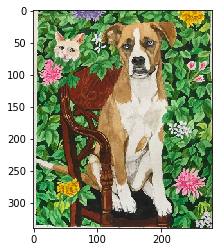

In [10]:
from skimage.color import rgb2gray
plt.imshow(image)
#gray_image = rgb2gray(image)
#plt.imshow(gray_image)

In [11]:
def sin(t, A, f, phi):
  return np.cos(2*np.pi*t*2+2*np.pi*A) + 2*np.cos(2*np.pi*t*2+2*np.pi*(f+.2)) + 3*np.cos(2*np.pi*t*4+2*np.pi*(phi+.75)) #1/(1 + np.exp(-x)) 

In [12]:
t = np.linspace(-1, 1, 50)

data = np.zeros((image.reshape(-1,3).shape[0],50))

for i in range(image.reshape(-1,3).shape[0]):
    data[i,:] = sin(t, image.reshape(-1,3)[:,0][i], image.reshape(-1,3)[:,1][i],image.reshape(-1,3)[:,2][i])

93089


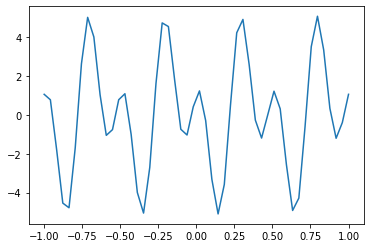

In [13]:
# plots an example of the data
i = np.random.randint(0,len(image.reshape(-1,3)))
print(i)

plt.plot(t, data[i])

In [14]:
class global_scaler:
        
    def fit(self, data):
        self.mean = np.mean(data.reshape(-1))
        self.std = np.std(data.reshape(-1))
        
    def fit_transform(self, data):
        self.fit(data)
        return self.transform(data)
    
    def transform(self, data):
        return (data - self.mean)/self.std
    
    def inverse_transform(self, data):
        return (data * self.std) + self.mean

In [15]:
scaler = global_scaler()

scaled_data = scaler.fit_transform(data)


In [16]:
print(scaler.mean)
print(scaler.std)

0.021532805024098236
2.637291777471079


57086


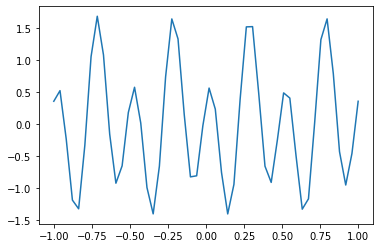

In [17]:
# plots an example of the data
i = np.random.randint(0,len(image.reshape(-1,3)))
print(i)

plt.plot(t, scaled_data[i])

In [18]:
scaler = global_scaler()

scaled_data = scaler.fit_transform(data)

In [ ]:
nclusters = 5

kmeans = KMeans(n_clusters=nclusters, random_state=0).fit(scaled_data)

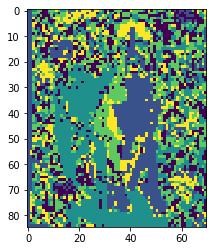

In [ ]:
plt.imshow(kmeans.labels_.reshape(image.shape[0:2]))

In [ ]:
clusters_2nd = kmeans.labels_
centroids_2nd = kmeans.cluster_centers_

#### Reformat the kmeans results to use as the initial guess for Dictionary learning
labels = clusters_2nd
comp_init = np.zeros_like(centroids_2nd)
lm_init = np.zeros((len(labels),nclusters))
for i in range(nclusters):
    u = np.zeros_like(labels)
    u[labels==i] = 1
    lm_init[:,i] = u
    comp_init[i] = centroids_2nd[i]

NameError: ignored

In [ ]:
from sklearn.decomposition import DictionaryLearning

model = DictionaryLearning(n_components=5,code_init=lm_init, dict_init = comp_init, n_jobs=-1, max_iter=1000, transform_algorithm='lasso_lars', alpha=1, fit_algorithm='cd',positive_code=True, tol=1e-9)

model.fit(scaled_data)

DictionaryLearning(alpha=1,
                   code_init=array([[0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.],
       ...,
       [0., 0., 0., 0., 1.],
       [0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0.]]),
                   dict_init=array([[ 0.24057235,  0.33993782, -0.42520758, -1.37596915, -1.5034909 ,
        -0.46465292,  1.03073624,  1.82879266,  1.36926155,  0.17151703,
        -0.68545853, -0.5831406 ,  0.09402075,  0.40248779, -0.17656919,
        -1.1804676...
        -0.67780707, -0.17128111,  0.86448285,  1.43764362,  0.90469698,
        -0.38616149, -1.38792109, -1.31271561, -0.34514346,  0.56440594]]),
                   fit_algorithm='cd', max_iter=1000, n_components=5, n_jobs=-1,
                   positive_code=True, positive_dict=False, random_state=None,
                   split_sign=False, tol=1e-09,
                   transform_algorithm='lasso_lars', transform_alpha=None,
                   transform_max_iter=1000, transform

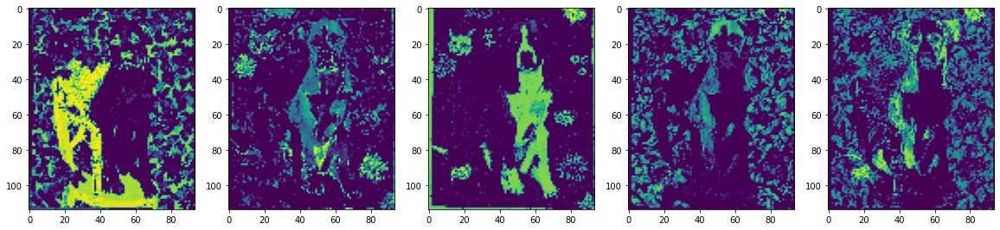

In [ ]:
out = model.transform(scaled_data)

fig, ax = plt.subplots(1,5, figsize=(20,5))  

for i, ax in enumerate(ax):
  ax.imshow(out[:,i].reshape(image.shape[0], image.shape[1]))

In [ ]:
return_data = np.dot(out,model.components_)

In [ ]:
mean_squared_error(scaled_data, return_data)    

0.08482875291745778

9098


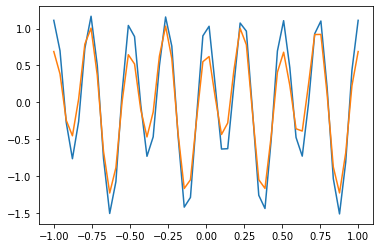

In [ ]:
i = np.random.randint(0,len(image[:,:,1].reshape(-1)))
print(i)

plt.plot(t, scaled_data[i])
plt.plot(t, return_data[i])

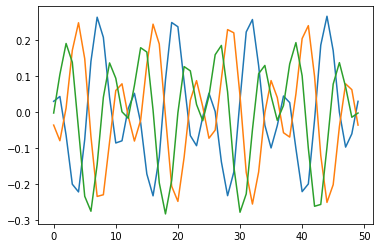

In [ ]:
plt.plot(model.components_[0])
plt.plot(model.components_[1])
plt.plot(model.components_[2])

In [ ]:
mse = np.mean((scaled_data - return_data)**2,axis=1)

NameError: name 'return_data' is not defined

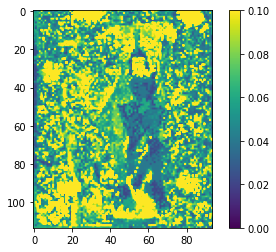

In [ ]:
plt.imshow(mse.reshape(image.shape[0:2]))
plt.clim(0,.1)
plt.colorbar()

In [21]:
def make_folder(folder, **kwargs):
    """
    Function that makes new folders
    Parameters
    ----------'
    folder : string
        folder where to save
    Returns
    -------
    folder : string
        folder where to save
    """

    # Makes folder
    os.makedirs(folder, exist_ok=True)

    return (folder)

# The second version of modification under tf=2.x, reload the model for each coef update.


In [83]:
class Sampling(layers.Layer):
  """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

  def call(self, inputs):
    z_mean, z_log_var = inputs
    batch = tf.shape(z_mean)[0]
    dim = tf.shape(z_mean)[1]
    epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
    return z_mean + tf.exp(0.5 * z_log_var) * epsilon

class model_builder:
    
    def __init__(self,
                 input_data, 
                drop_frac = 0.2, 
                 layer_size = 128, 
                 num_ident_blocks = 3, 
                 l1_norm = 0,
                 l1_norm_embedding = 1e-3, 
                 layer_steps = 2,
                 embedding = 16, 
                 VAE = True,
                 coef = 1):
    # Sets self.mean and self.std to use in the loss function;
#       self.mean = 0
#       self.std = 0
    
      # Sets the L1 norm on the decoder/encoder layers
      self.l1_norm = l1_norm
 
      # Sets the fraction of dropout
      self.drop_frac = drop_frac
      
      # saves the shape of the input data
      self.data_shape = input_data.shape
 
      # Sets the number of neurons in the encoder/decoder layers
      self.layer_size = layer_size
 
      # Sets the number of neurons in the embedding layer
      self.embedding = embedding 
 
      # Bool to set if the model is a VAE 
      self.VAE = VAE
 
      # Set the magnitude of the l1 regularization on the embedding layer.
      self.l1_norm_embedding = l1_norm_embedding
 
      # sets the number of layers between the residual layer
      self.layer_steps = layer_steps

      self.coef = coef
 
      # set the number of identity block
      self.num_ident_blocks = num_ident_blocks
 
      self.model_constructor(input_data)
 
    def identity_block(self, X, name, 
                      block):
      
      # sets the name of the conv layers
      LSTM_name_base =  name + '_LSTM_Res_' + block
      bn_name_base = name + '_layer_norm_' + block
 
 
      # output for the residual layer
      X_shortcut = X
 
      for i in range(self.layer_steps):
        # bidirectional LSTM
        X = layers.Bidirectional(LSTM(self.layer_size, 
                                      return_sequences=True, 
                                      dropout=self.drop_frac,
                                      activity_regularizer=l1(self.l1_norm)), 
                                input_shape=(self.data_shape[1], self.data_shape[2]))(X)
 
        # TODO, We could add layer norm
        X = layers.Activation('relu')(X)  
 
      X = layers.add([X, X_shortcut])
      X = layers.LayerNormalization(axis = 1, name = bn_name_base + '_res_end')(X)
      X = layers.Activation('relu')(X)
 
      return X
 
    def model_constructor(self, input_data):
      # defines the input
      encoder_input = layers.Input(shape=(self.data_shape[1:]))

      X = encoder_input
      
      for i in range(self.num_ident_blocks):
        X = self.identity_block(X, 'encoder', string.ascii_uppercase[i+1])
        
      # This is in preparation for the embedding layer
      X = layers.Bidirectional(LSTM(self.layer_size, 
                                    return_sequences=False, 
                                    dropout=self.drop_frac,
                                    activity_regularizer=l1(self.l1_norm)), 
                                    input_shape=(self.data_shape[1], 
                                                 self.data_shape[2]))(X)   
      
      X = layers.BatchNormalization(axis=1, name='last_encode')(X)
      X = layers.Activation('relu')(X)

      if self.VAE:
            
            z_mean = layers.Dense(self.embedding, name="z_mean")(X)
            z_log_var = layers.Dense(self.embedding, name="z_log_var")(X)
            self.to_dense = Sampling()((z_mean, z_log_var))
            z = layers.Dense(self.embedding, name="embedding")(self.to_dense)
            z = layers.Activation('relu')(z)
            z = layers.ActivityRegularization(l1=self.l1_norm_embedding*10**self.coef)(z)
            # update the self.mean and self.std:
#            self.mean = z_mean
#            self.std = z_log_var

      self.encoder_model = Model(inputs=encoder_input, outputs=z, name='LSTM_encoder')

      decoder_input = layers.Input(shape=(self.embedding,), name="z_sampling")

      X = layers.RepeatVector(self.data_shape[1])(decoder_input)
 
      X = layers.Bidirectional(LSTM(self.layer_size, return_sequences=True, 
                                    dropout=self.drop_frac,
                                    activity_regularizer=l1(self.l1_norm)))(X)
 
      # X = layers.BatchNormalization(axis = 1, name = 'fires_decode')(X)
      X = layers.Activation('relu')(X)
 
      for i in range(self.num_ident_blocks):
        X = self.identity_block(X, 'decoder', string.ascii_uppercase[i+1])
    
 
      X = layers.LayerNormalization(axis=1, name='batch_normal')(X)
      X = layers.TimeDistributed(Dense(1, activation='linear'))(X)

      self.decoder_model = Model(inputs=decoder_input, outputs=X, name='LSTM_encoder')

      outputs = self.decoder_model(z)

      self.vae = tf.keras.Model(inputs=encoder_input, outputs=outputs, name="vae")

      # Add KL divergence regularization loss.
      kl_loss = -0.5 * tf.reduce_mean(z_log_var - tf.square(z_mean) - tf.exp(z_log_var) + 1)
      self.vae.add_loss(self.coef*kl_loss)

In [84]:
epochs=10000 
epoch_per_increase = 25
iteration = (epochs//epoch_per_increase) + 1
iteration

401

In [85]:
1000

1000

In [23]:
import os


def Train(epochs, epoch_per_increase, initial_beta, beta_per_increase):
    best_loss = float('inf')
    iteration = (epochs//epoch_per_increase) + 1
    model = []
    #filepath =folder + '/if_appear_means_bug_happens.hdf5'
    
    for i in range(iteration):
        if i == iteration-1:
            training_epochs = epochs - epoch_per_increase*(iteration-1)
            if training_epochs <= 0:
                break
        else:
            training_epochs = epoch_per_increase
            
        beta = initial_beta + beta_per_increase*i
        print(beta)
        del(model )
        model = model_builder(np.atleast_3d(scaled_data),embedding=16, 
                      VAE=True, l1_norm_embedding=1e-3,coef=beta)
        run_id = 'V6_fast_100_epochs_per_step_dense_L1_phase_shift_Notebook_w_layernorm_VAE (modified_2)' + np.str(model.embedding) + '_layer_size_' + np.str(model.layer_size) + '_l1_norm_' + np.str(model.l1_norm) + '_l1_norm_' + np.str(model.l1_norm_embedding) + '_VAE_' + np.str(model.VAE)
        folder = make_folder(f'/content/drive/My Drive/papers/Faster_Better_Paper/{beta}_'+ run_id)

        if i >0:
            print(filepath)
            model.vae.load_weights(filepath)
            
        optimizer = tf.keras.optimizers.Adam(learning_rate=3e-5)
        model.vae.compile(optimizer, loss=tf.keras.losses.MeanSquaredError())
        
#        beta = beta + i*beta_per_increase
        # sets the file path
        epoch_begin = i*epoch_per_increase
        filepath = folder + '/triple_phase_weights_beta_' + np.str(beta)+'_epochs_begin_'+np.str(epoch_begin)+'+{epoch:04d}'+'-{loss:.5f}.hdf5'

        # callback for saving checkpoints. Checkpoints are only saved when the model improves
        checkpoint = keras.callbacks.ModelCheckpoint(filepath, monitor='loss',
                                                      verbose=0, save_best_only=True,
                                                      save_weights_only=True, mode='min')

#         if i==0:
            
#             model.vae.compile(optimizer, loss=KL_Loss(0,0,beta))
#         else:
#             model.vae.compile(optimizer, loss=KL_Loss(model.mean,model.std,beta))
        model.vae.fit(np.atleast_3d(scaled_data),
                np.atleast_3d(scaled_data),
                batch_size=320, epochs=training_epochs,callbacks=[checkpoint])
    
#        total_loss = hist.history['loss'][0]
    
#        best_loss = total_loss
        filepath = folder + '/triple_phase_weights2_epochs='+np.str(i)+'.hdf5'
        model.vae.save_weights(filepath)

In [ ]:
Train(epochs,epoch_per_increase,0,0.1)

0.0
Epoch 1/25
298/298 [==============================] - 83s 280ms/step - loss: 2.0579
Epoch 2/25
298/298 [==============================] - 84s 281ms/step - loss: 1.2585
Epoch 3/25
298/298 [==============================] - 84s 281ms/step - loss: 0.7782
Epoch 4/25
298/298 [==============================] - 84s 281ms/step - loss: 0.4732
Epoch 5/25
298/298 [==============================] - 84s 281ms/step - loss: 0.3312
Epoch 6/25
298/298 [==============================] - 84s 281ms/step - loss: 0.2620
Epoch 7/25
298/298 [==============================] - 84s 281ms/step - loss: 0.2178
Epoch 8/25
298/298 [==============================] - 84s 281ms/step - loss: 0.1890
Epoch 9/25
298/298 [==============================] - 84s 281ms/step - loss: 0.1664
Epoch 10/25
298/298 [==============================] - 84s 281ms/step - loss: 0.1467
Epoch 11/25
298/298 [==============================] - 84s 281ms/step - loss: 0.1298
Epoch 12/25
298/298 [==============================] - 84s 281ms/step 

In [ ]:
model

In [20]:
hist.history

NameError: ignored

In [ ]:
hist.history['loss'][-1]

3.138639668055943

In [ ]:
filepath

'Faster_Better_Paper/scaled_Triple_Phase_VAE_embedding_16_layer_size_128_l1_norm_0_l1_norm_0.001_VAE_True_coeff_1/triple_phase_weights2.{epoch:06d}-{loss:.4f}.hdf5'

In [86]:
beta = 0

model = model_builder(np.atleast_3d(scaled_data),embedding=16, 
              VAE=True, l1_norm_embedding=1e-3,coef=beta)

In [78]:
ls

Band_Excitation/
clustering/
codes_dog/
nmf/
pca/
pca_clustering/
Phase_Field/
piezoresponse_autoencoder/
resonance_autoencoder/
structure/
triple_phase_weights_beta_2.0_epochs_begin_500+0019-0.45343.hdf5


In [87]:
model.vae.load_weights('triple_phase_weights_beta_2.0_epochs_begin_500+0019-0.45343.hdf5')

In [80]:
out = model.vae.predict(np.atleast_3d(scaled_data))

KeyboardInterrupt: 

In [ ]:
out.shape

In [45]:
tf.reduce_mean((out.squeeze()-scaled_data)**2)

<tf.Tensor: shape=(), dtype=float64, numpy=0.14734772136362598>

55957


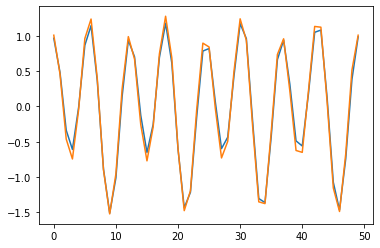

In [42]:
i = np.random.randint(0,out.shape[0])
print(i)
plt.plot(out[i])
plt.plot(scaled_data[i])

In [30]:
embedding = model.encoder_model.predict(np.atleast_3d(scaled_data))

In [53]:
final_out = model.decoder_model.predict(embedding)

In [ ]:
i = np.random.randint(0,out.shape[0])
print(i)
plt.plot(final_out[i])
plt.plot(scaled_data[i])

In [33]:
image.shape[0:2]

(340, 280)

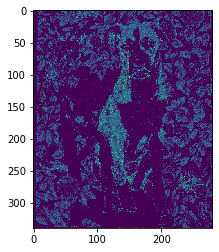

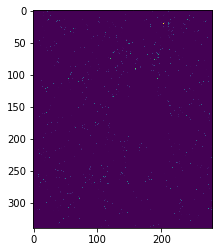

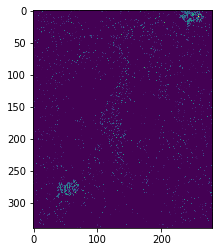

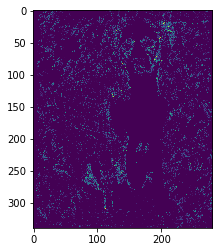

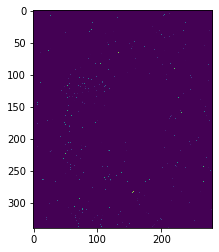

...

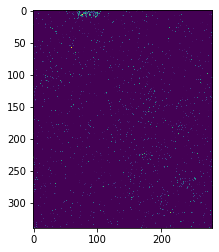

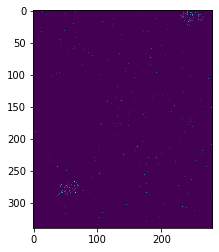

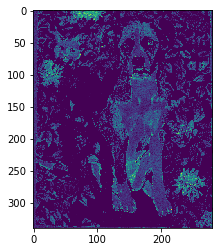

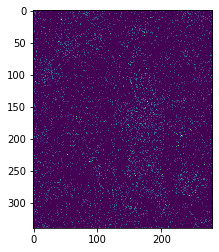

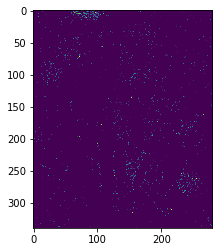

In [32]:
for i in range(16):
  plt.figure()
  plt.imshow(embedding[:,i].reshape(image.shape[0:2]))

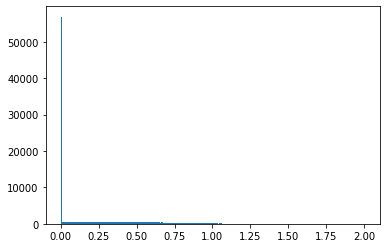

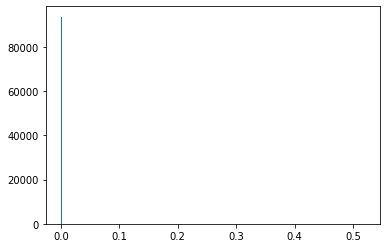

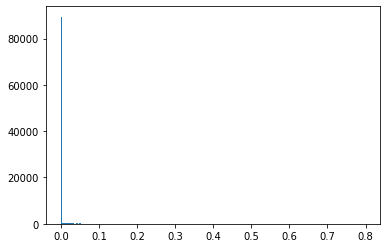

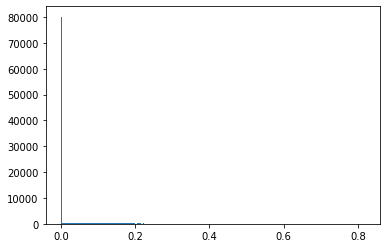

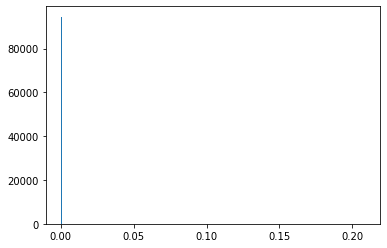

...

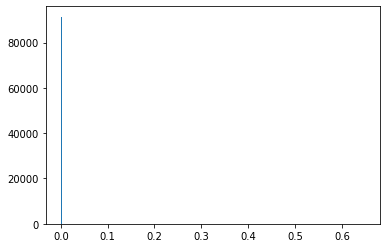

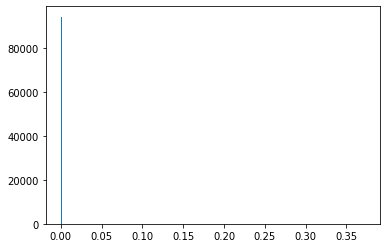

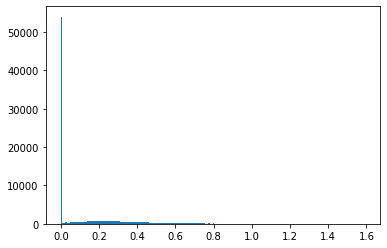

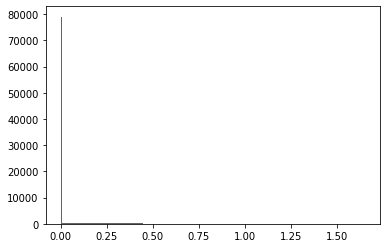

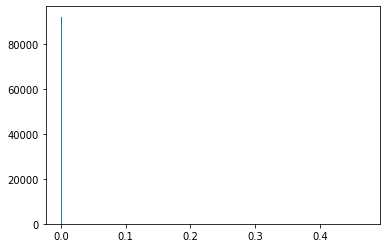

In [55]:
for i in range(16):
  plt.figure()
  plt.hist(embedding[:,i],200)

In [136]:
ranges = [1.2,0,0.06,0.25,0,0,0.6,0.2,0,0,0,0,0,0.8,0.5,0]

In [46]:
cd Faster_Better_Paper/

/home/shuyu/497_MAT_Assignment/Faster_Better_Paper


In [48]:
import warnings
warnings.filterwarnings('ignore')
import imp
from matplotlib.ticker import FormatStrFormatter
import matplotlib.pyplot as plt
import codes_dog.analysis.rnn as rnn
import codes_dog.util as util
import codes_dog.analysis.machine_learning as ml
import codes_dog.analysis as an
import codes_dog.processing as p
import codes_dog.viz as viz
import codes_dog.util.input_output as io_transfer
from sklearn.decomposition import NMF
from scipy import io
import numpy as np
import os
import os.path

Using TensorFlow backend.


In [51]:
# builds folders where the data will be saved
folder_structure = util.file.make_folder(
    './structure')
folder_BE = util.file.make_folder(
    './Band_Excitation')
folder_BE_Movie_files = util.file.make_folder(
    folder_BE + '/BE_Movie_Files')
folder_BE_all_images = util.file.make_folder(
    folder_BE + '/BE_all_images')
folder_BE_spectra = util.file.make_folder(
    folder_BE + '/BE_spectra')
folder_BE_cleaned_spectra = util.file.make_folder(
    folder_BE + '/cleaned_spectra')
folder_pca = util.file.make_folder(
    './pca')
folder_nmf = util.file.make_folder(
    './nmf')
folder_clustering = util.file.make_folder('./clustering')
folder_pca_clustering = util.file.make_folder(
    './pca_clustering')
folder_piezoresponse_autoencoder = util.file.make_folder(
    './piezoresponse_autoencoder')
folder_resonance_autoencoder = util.file.make_folder(
    './resonance_autoencoder')
folder_piezoresponse_autoencoder_movie = util.file.make_folder(
    folder_piezoresponse_autoencoder + '/movie')
folder_piezoresponse_autoencoder_training_movie = util.file.make_folder(
    folder_piezoresponse_autoencoder + '/training_movie')
folder_resonance_autoencoder_movie = util.file.make_folder(
    folder_resonance_autoencoder + '/movie')
folder_resonance_autoencoder_training_movie = util.file.make_folder(
    folder_resonance_autoencoder + '/training_movie')
folder_phase_field = util.file.make_folder(
    './Phase_Field')

In [128]:
plot_format = {
    # adds scalebar to image
    'add_scalebar': False,
    'just_try': [2000, 500],
    # sets the dimensions for the scalebar [(size of image),(size of scalebar)]
    'scalebar': [2000, 500],
    # selects if the image will be rotated
    'rotation': False,
    # selects the rotation angle of the image
    'angle': 60.46,
    # sets the fraction of the image to crop
    'frac_rm': 0.17765042979942694,
    # sets the resolution of the image
    'dpi': 300,
    # sets the default colormap
    'color_map': 'viridis',
    # sets if color bars should be added
    'color_bars': True}

In [129]:
# Sets what object to export
printing = {  # exports eps vector graphics (note these files can be large)
    'EPS': False,
    # exports png files
    'PNG': True,
    # prints image series (note this can take some time)
    'all_figures': False,
    # generates movies (note this can take some time)
    'movies': False,
    # resolution of the images
    'dpi': 300}

In [57]:
embedding.shape

(95200, 16)

In [60]:
ind = np.where(np.mean(embedding, axis=0) > 0)
embedding_small = embedding[:, ind].squeeze()

In [61]:
embedding_small.shape

(95200, 16)

In [135]:
voltage = np.linspace(0,50,50)

In [69]:
??viz.plot.generator_piezoresponse

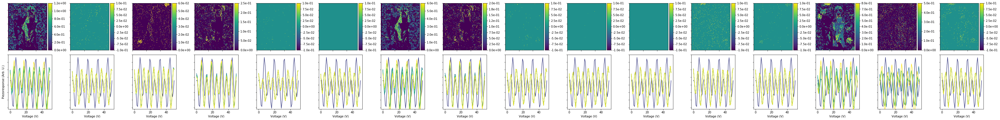

In [138]:
generate_piezo =viz.plot.generator_piezoresponse(model.decoder_model,
                            embedding,
                            voltage,
                            ranges,                   
                            5,
                            100,
                            printing,
                            plot_format,
                            folder_piezoresponse_autoencoder,
                            y_scale=[-1.6, 2])

In [81]:
from tensorflow.keras import backend as k

In [99]:
one = k.function([model.to_dense], model.encoder_model.output)
two = k.function([model.to_dense], model.vae.output)



In [91]:
z = np.zeros((1,16))
int_ = one([z])

In [92]:
int_

array([[-0.03132061, -0.4177883 , -0.37498942, -0.2968666 , -0.44671917,
        -0.6390762 , -0.0920866 , -0.33750492, -0.3222831 , -0.4127479 ,
        -0.46534425, -0.42369688, -0.40943617, -0.01218553, -0.41182578,
        -0.39966133]], dtype=float32)

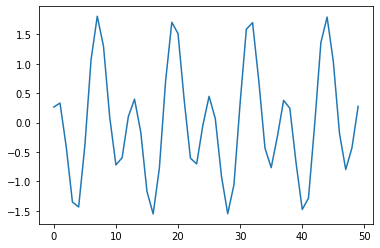

In [95]:
plt.plot(two([int_]).squeeze())

In [100]:
out.shape

(95200, 50, 1)

In [101]:
embedding.shape

(95200, 16)

In [102]:
vae_out.shape

(95200, 16)

In [103]:
check = two(embedding)

In [104]:
check.shape

(95200, 50, 1)

In [119]:
out_one = one(vae_out)

In [120]:
out_one.shape

(95200, 16)

In [131]:
cmap = plt.get_cmap('viridis')

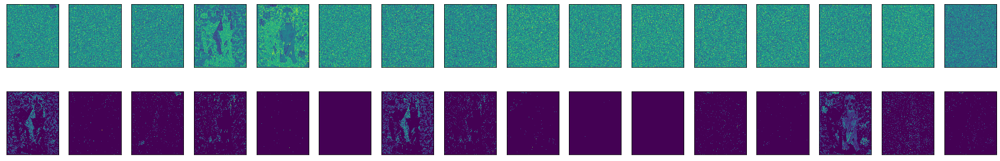

In [134]:
num = 16
plt.figure(figsize=(30, 5))
for i in range(num):
    # display original
    ax = plt.subplot(2, num, i+1)
    plt.imshow(vae_out[:,i].reshape(image.shape[0:2]),cmap=cmap)
    plt.get_cmap('viridis')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(2, num, i +1+ num)
    plt.imshow(out_one[:,i].reshape(image.shape[0:2]),cmap=cmap)
#    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

24897


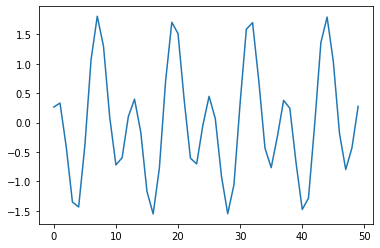

In [105]:
i = np.random.randint(0,out.shape[0])
print(i)
plt.plot(check[i])

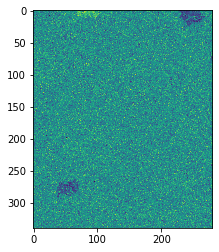

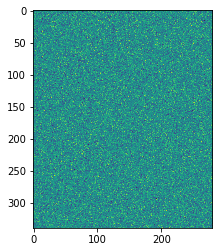

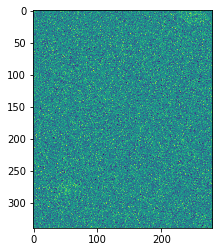

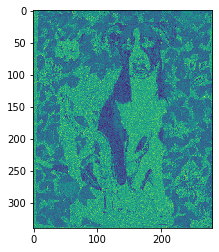

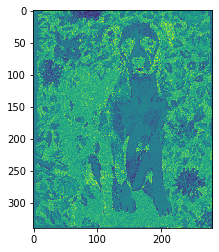

...

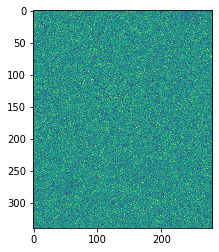

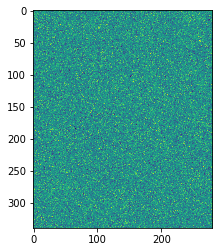

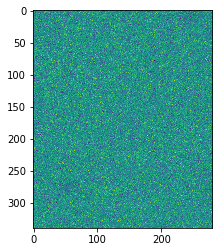

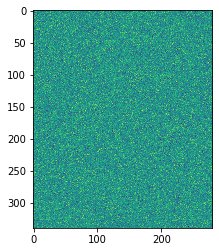

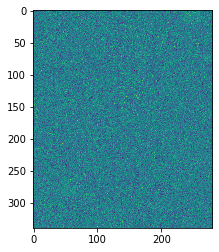

In [112]:
for i in range(16):
  plt.figure()
  plt.imshow(vae_out[:,i].reshape(image.shape[0:2]))

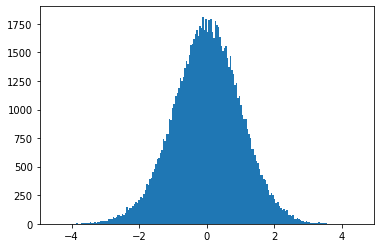

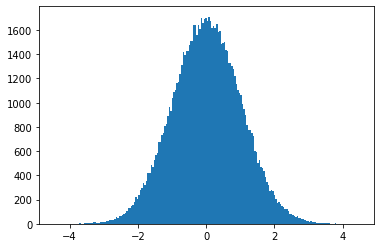

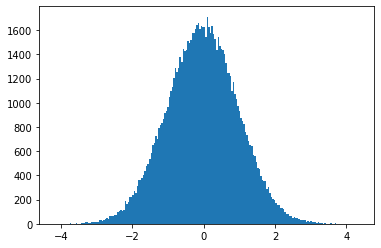

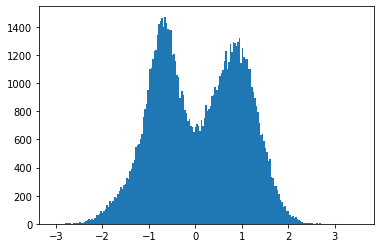

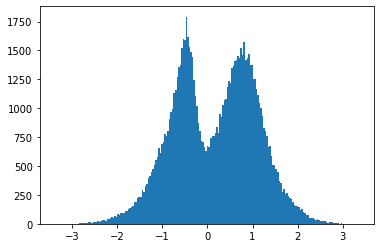

...

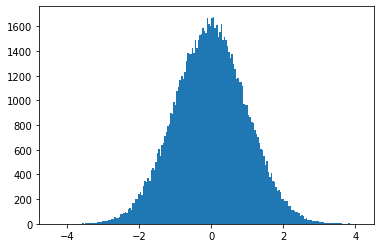

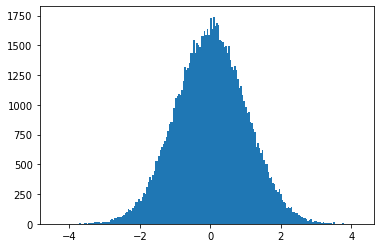

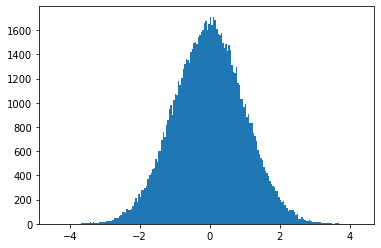

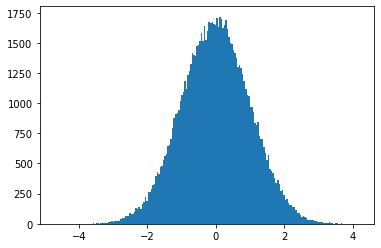

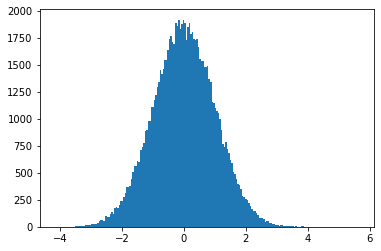

In [107]:
for i in range(16):
  plt.figure()
  plt.hist(vae_out[:,i],200)

In [116]:
ind = np.where(np.mean(abs(vae_out), axis=0) > 0)
embedding_small = vae_out[:, ind].squeeze()
embedding_small.shape

(95200, 16)

In [139]:
ranges = [[-4,4],[-4,4],[-4,4],[-3,3],[-3,3],[-4,4],[-4,4],[-4,4],[-4,4],[-4,4],[-4,4],[-4,4],[-4,4],[-4,4],[-4,4],[-4,4]]

In [114]:
len(ranges)

16

In [118]:
ranges[0][0]

-4

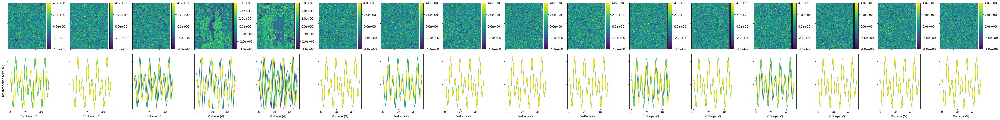

In [141]:
generate_piezo =viz.plot.generator_piezoresponse(two,
                            vae_out,
                            voltage,
                            ranges,                   
                            5,
                            100,
                            printing,
                            plot_format,
                            folder_piezoresponse_autoencoder,
                            y_scale=[-1.6, 2])

In [34]:
def get_activations(model, X=[], i=[], mode='test'):
    """
    function to get the activations of a specific layer
    this function can take either a model and compute the activations or can load previously
    generated activations saved as an numpy array
    Parameters
    ----------
    model : keras model, object
        pre-trained keras model
    X  : numpy array, float
        Input data
    i  : numpy, int
        index of the layer to extract
    mode : string, optional
        test or train, changes the model behavior to scale the network properly when using
        dropout or batchnorm
    Returns
    -------
    activation : float
        array containing the output from layer i of the network
    """
    # if a string is passed loads the activations from a file
    if isinstance(model, str):
        activation = np.load(model)
        print(f'activations {model} loaded from saved file')
    else:
        # computes the output of the ith layer
        activation = get_ith_layer_output(model, np.atleast_3d(X), i, model)

    return activation


def get_ith_layer_output(model, X, i, mode='test'):
    """
    Computes the activations of a specific layer
    see https://keras.io/getting-started/faq/#keras-faq-frequently-asked-keras-questions'
    Parameters
    ----------
    model : keras model, object
        pre-trained keras model
    X  : numpy array, float
        Input data
    i  : numpy, int
        index of the layer to extract
    mode : string, optional
        test or train, changes the model behavior to scale the network properly when using
        dropout or batchnorm
    Returns
    -------
    layer_output : float
        array containing the output from layer i of the network
    """
    # computes the output of the ith layer
    get_ith_layer = keras.backend.function(
        [model.layers[0].input, keras.backend.learning_phase()], [model.layers[i].output])
    layer_output = get_ith_layer([X, 0 if mode == 'test' else 1])[0]

    return layer_output


In [35]:
model.encoder_model.summary()

Model: "LSTM_encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 50, 1)]      0                                            
__________________________________________________________________________________________________
bidirectional (Bidirectional)   (None, 50, 256)      133120      input_1[0][0]                    
__________________________________________________________________________________________________
activation (Activation)         (None, 50, 256)      0           bidirectional[0][0]              
__________________________________________________________________________________________________
bidirectional_1 (Bidirectional) (None, 50, 256)      394240      activation[0][0]                 
_______________________________________________________________________________________

In [ ]:
model.encoder_model.summary()

Model: "LSTM_encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 50, 1)]      0                                            
__________________________________________________________________________________________________
bidirectional (Bidirectional)   (None, 50, 256)      133120      input_1[0][0]                    
__________________________________________________________________________________________________
activation (Activation)         (None, 50, 256)      0           bidirectional[0][0]              
__________________________________________________________________________________________________
bidirectional_1 (Bidirectional) (None, 50, 256)      394240      activation[0][0]                 
_______________________________________________________________________________________

In [38]:
for i, j in enumerate(model.encoder_model.layers):
  print(i,j)

0 <tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7fa597704650>
1 <tensorflow.python.keras.layers.wrappers.Bidirectional object at 0x7fa597704150>
2 <tensorflow.python.keras.layers.core.Activation object at 0x7fa596ed3090>
3 <tensorflow.python.keras.layers.wrappers.Bidirectional object at 0x7fa594483c50>
4 <tensorflow.python.keras.layers.core.Activation object at 0x7fa5943c9c50>
5 <tensorflow.python.keras.layers.merge.Add object at 0x7fa59447a090>
6 <tensorflow.python.keras.layers.normalization.LayerNormalization object at 0x7fa59447acd0>
7 <tensorflow.python.keras.layers.core.Activation object at 0x7fa594223410>
8 <tensorflow.python.keras.layers.wrappers.Bidirectional object at 0x7fa59420fc50>
9 <tensorflow.python.keras.layers.core.Activation object at 0x7fa59422f8d0>
10 <tensorflow.python.keras.layers.wrappers.Bidirectional object at 0x7fa58c7c4910>
11 <tensorflow.python.keras.layers.core.Activation object at 0x7fa58c5e5950>
12 <tensorflow.python.keras.layers.merge

In [68]:
embed = tf.keras.Model(model.vae.layers[27].get_input_shape_at(0), model.vae.output)

ValueError: The list of inputs passed to the model is redundant. All inputs should only appear once. Found: [None, 16, None, 16]

In [35]:
vae = tf.keras.Model(model.encoder_model.inputs, model.encoder_model.layers[27].output)

In [36]:
vae_out = vae.predict(np.atleast_3d(scaled_data), batch_size=320)

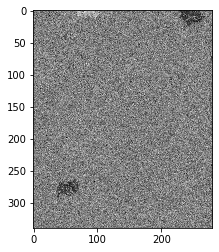

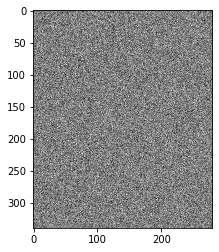

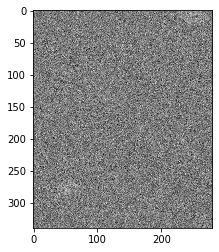

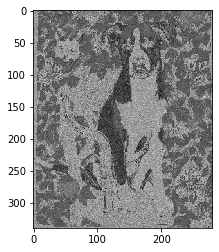

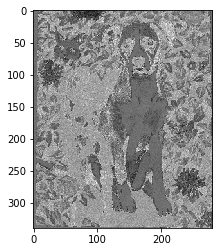

...

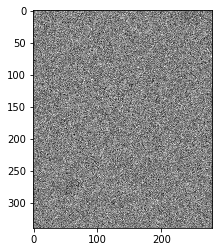

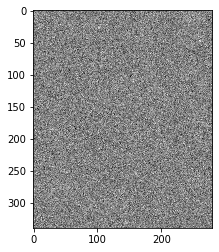

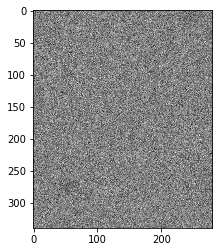

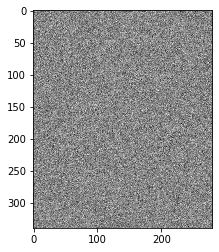

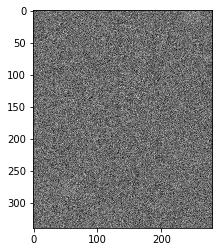

In [130]:
for i in range(16):
  plt.figure()
  plt.imshow(vae_out[:,i].reshape(image.shape[0:2]))

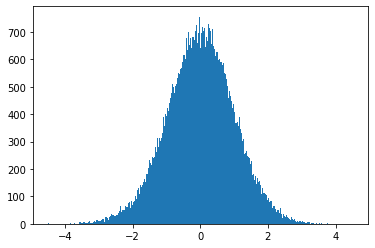

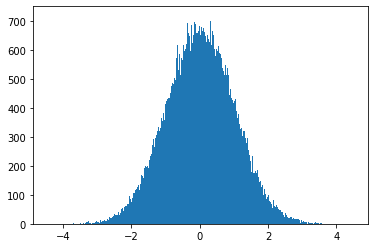

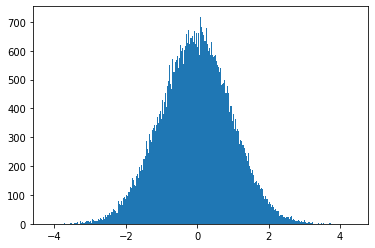

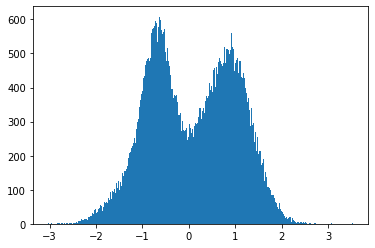

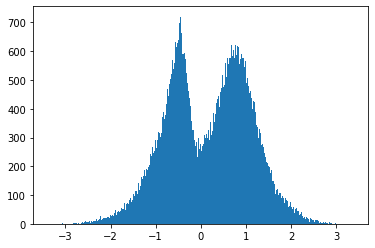

...

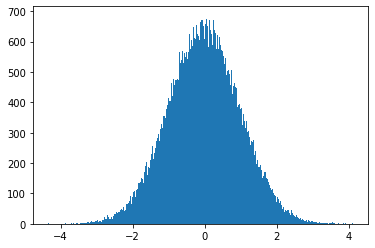

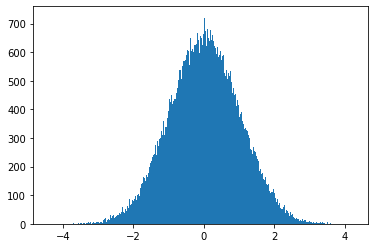

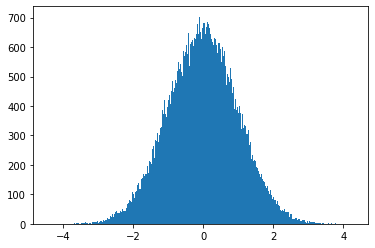

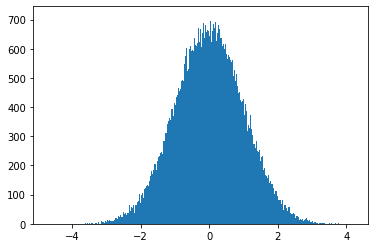

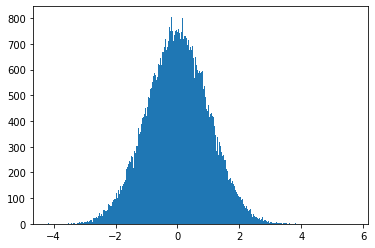

In [40]:
for i in range(16):
  plt.figure()
  plt.hist(vae_out[:,i],500)

In [ ]:
np.save('/content/drive/My Drive/papers/Faster_Better_Paper/' + run_id + '/Data_file',scaled_data)

In [ ]:
# sets the file path
filepath = folder + '/triple_phase_weights2.{epoch:06d}-{loss:.4f}.hdf5'

# callback for saving checkpoints. Checkpoints are only saved when the model improves
checkpoint = keras.callbacks.ModelCheckpoint(filepath, monitor='loss',
                                              verbose=0, save_best_only=True,
                                              save_weights_only=True, mode='min')

In [ ]:
model.model.load_weights('/content/drive/My Drive/papers/Faster_Better_Paper/scaled_Layer_Norm_Triple_Phase_no_VAE_embedding_16_layer_size_128_l1_norm_0_l1_norm_0.001_VAE_False_coeff_0/triple_phase_weights.000997-0.0136.hdf5')

In [ ]:
model.model.fit(np.atleast_3d(scaled_data),
                np.atleast_3d(scaled_data),
                batch_size=320, epochs=1000, callbacks=[checkpoint])

In [ ]:
out = model.model.predict(np.atleast_3d(scaled_data), batch_size=320)

3086


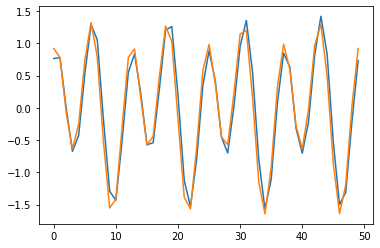

In [ ]:
i = np.random.randint(0,out.shape[0])
print(i)
plt.plot(out[i])
plt.plot(scaled_data[i])

In [ ]:
def get_activations(model, X=[], i=[], mode='test'):
    """
    function to get the activations of a specific layer
    this function can take either a model and compute the activations or can load previously
    generated activations saved as an numpy array
    Parameters
    ----------
    model : keras model, object
        pre-trained keras model
    X  : numpy array, float
        Input data
    i  : numpy, int
        index of the layer to extract
    mode : string, optional
        test or train, changes the model behavior to scale the network properly when using
        dropout or batchnorm
    Returns
    -------
    activation : float
        array containing the output from layer i of the network
    """
    # if a string is passed loads the activations from a file
    if isinstance(model, str):
        activation = np.load(model)
        print(f'activations {model} loaded from saved file')
    else:
        # computes the output of the ith layer
        activation = get_ith_layer_output(model, np.atleast_3d(X), i, model)

    return activation


def get_ith_layer_output(model, X, i, mode='test'):
    """
    Computes the activations of a specific layer
    see https://keras.io/getting-started/faq/#keras-faq-frequently-asked-keras-questions'
    Parameters
    ----------
    model : keras model, object
        pre-trained keras model
    X  : numpy array, float
        Input data
    i  : numpy, int
        index of the layer to extract
    mode : string, optional
        test or train, changes the model behavior to scale the network properly when using
        dropout or batchnorm
    Returns
    -------
    layer_output : float
        array containing the output from layer i of the network
    """
    # computes the output of the ith layer
    get_ith_layer = keras.backend.function(
        [model.layers[0].input, keras.backend.learning_phase()], [model.layers[i].output])
    layer_output = get_ith_layer([X, 0 if mode == 'test' else 1])[0]

    return layer_output


In [ ]:
for i, j in enumerate(model.model.layers):
  print(i,j)

0 <tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7f3e33581940>
1 <tensorflow.python.keras.layers.wrappers.Bidirectional object at 0x7f3e33581470>
2 <tensorflow.python.keras.layers.core.Activation object at 0x7f3e336a7080>
3 <tensorflow.python.keras.layers.wrappers.Bidirectional object at 0x7f3e335ddbe0>
4 <tensorflow.python.keras.layers.core.Activation object at 0x7f3e332dcc50>
5 <tensorflow.python.keras.layers.merge.Add object at 0x7f3e335ce780>
6 <tensorflow.python.keras.layers.normalization.LayerNormalization object at 0x7f3e3360bda0>
7 <tensorflow.python.keras.layers.core.Activation object at 0x7f3e332e09e8>
8 <tensorflow.python.keras.layers.wrappers.Bidirectional object at 0x7f3e332f6cf8>
9 <tensorflow.python.keras.layers.core.Activation object at 0x7f3e330d1ba8>
10 <tensorflow.python.keras.layers.wrappers.Bidirectional object at 0x7f3e330d7b38>
11 <tensorflow.python.keras.layers.core.Activation object at 0x7f3e32f359e8>
12 <tensorflow.python.keras.layers.merge

In [ ]:
embedding = get_ith_layer_output(model.model, np.atleast_3d(scaled_data), 24)

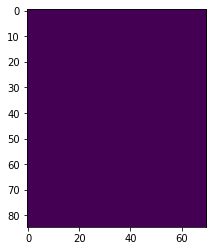

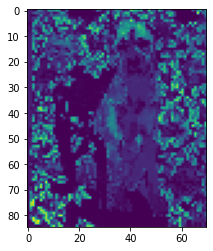

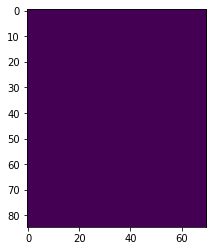

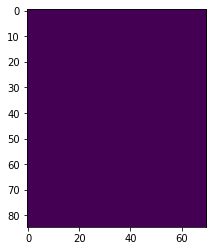

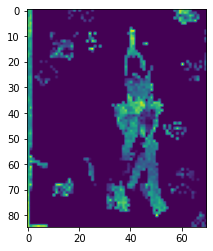

...

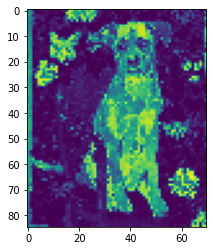

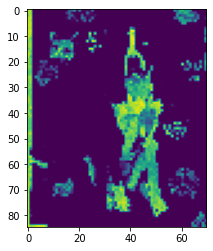

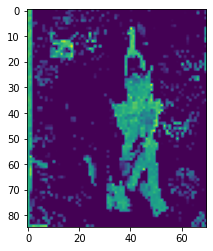

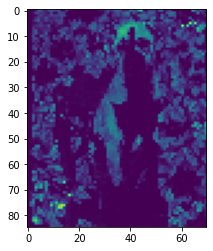

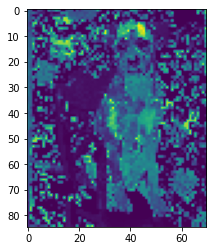

In [ ]:
for i in range(16):
  plt.figure()
  plt.imshow(embedding[:,i].reshape(image.shape[0:2]))

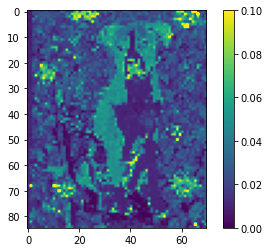

In [ ]:
mse = np.mean((scaled_data - out.squeeze())**2,axis=1)
plt.imshow(mse.reshape(image.shape[0:2]))
plt.colorbar()
plt.clim(0,.1)


In [ ]:
scaled_data.shape


(5950, 50)

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=3e-5)
model.decoder_model.compile(optimizer, loss=tf.keras.losses.MeanSquaredError())

model.decoder_model.fit(embedding, scaled_data, batch_size=1800, epochs=100)

Epoch 1/100


KeyboardInterrupt: ignored